In [44]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from googleapiclient.discovery import build
import requests
from bs4 import BeautifulSoup
import re
import math
import time

O que fazer:
* pega a data de lançamento de musicas no spotify, fazer isso em duas partes
* ver a duração das musicas de milisegundos para minutos, e ver se tem ouliers
* ver a relação das features com o engajamento

# Entrada de dados

In [5]:
spotify_youtube_pt1 = pd.read_csv("Dados/spotify_youtube_up_pt1.csv")
spotify_youtube_pt2 = pd.read_csv("Dados/spotify_youtube_up_pt2.csv")

In [6]:
data_extracao = pd.to_datetime("2023-02-07")
spotify_youtube_pt1["upload_date"] = pd.to_datetime(spotify_youtube_pt1["upload_date"])
spotify_youtube_pt1["dias_na_plataforma"] = (data_extracao - spotify_youtube_pt1["upload_date"]).dt.days

spotify_youtube_pt2["upload_date"] = pd.to_datetime(spotify_youtube_pt2["upload_date"])
spotify_youtube_pt2["dias_na_plataforma"] = (data_extracao - spotify_youtube_pt2["upload_date"]).dt.days

In [7]:
spotify_youtube = pd.concat([spotify_youtube_pt1,spotify_youtube_pt2])

In [8]:
spotify_youtube.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15610 entries, 0 to 7789
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Unnamed: 0          15610 non-null  int64         
 1   Artist              15610 non-null  object        
 2   Url_spotify         15610 non-null  object        
 3   Track               15610 non-null  object        
 4   Album               15610 non-null  object        
 5   Album_type          15610 non-null  object        
 6   Uri                 15610 non-null  object        
 7   Danceability        15609 non-null  float64       
 8   Energy              15609 non-null  float64       
 9   Key                 15609 non-null  float64       
 10  Loudness            15609 non-null  float64       
 11  Speechiness         15609 non-null  float64       
 12  Acousticness        15609 non-null  float64       
 13  Instrumentalness    15609 non-null  float64       
 

In [9]:
spotify_youtube.columns

Index(['Unnamed: 0', 'Artist', 'Url_spotify', 'Track', 'Album', 'Album_type',
       'Uri', 'Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Duration_ms', 'Url_youtube', 'Title', 'Channel', 'Views', 'Likes',
       'Comments', 'Description', 'Licensed', 'official_video', 'Stream',
       'upload_date', 'dias_na_plataforma'],
      dtype='object')

In [10]:
print(f'numeros de musicas com 30 dias ou menos de existencia: {len(spotify_youtube[spotify_youtube['dias_na_plataforma']<31])}')
print(f'numeros de musicas com 90 dias ou menos de existencia: {len(spotify_youtube[spotify_youtube['dias_na_plataforma']<91])}')
print(f'numeros de musicas com 365 dias ou menos de existencia: {len(spotify_youtube[spotify_youtube['dias_na_plataforma']<365])}')

numeros de musicas com 30 dias ou menos de existencia: 322
numeros de musicas com 90 dias ou menos de existencia: 1107
numeros de musicas com 365 dias ou menos de existencia: 3379


In [11]:
youtube_df=spotify_youtube[['Artist','Track','Album','Album_type','Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms','Url_youtube', 'Title', 'Channel', 'Views', 'Likes','Comments', 'Description','upload_date', 'dias_na_plataforma']]
youtube_df=youtube_df.reset_index()
spotify_df=spotify_youtube[['Artist', 'Url_spotify', 'Track', 'Album', 'Album_type','Uri', 'Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms','Stream','upload_date','dias_na_plataforma']]
spotify_df=spotify_df.reset_index()

In [12]:
youtube_df.head(5)

,index,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,...,Duration_ms,Url_youtube,Title,Channel,Views,Likes,Comments,Description,upload_date,dias_na_plataforma
0,0,Gorillaz,Feel Good Inc.,Demon Days,album,0.818,0.705,6.0,-6.679,0.1770,...,222640.0,https://www.youtube.com/watch?v=HyHNuVaZJ-k,Gorillaz - Feel Good Inc. (Official Video),Gorillaz,693555221.0,6220896.0,169907.0,Official HD Video for Gorillaz' fantastic trac...,2016-06-28 12:53:12,2414
1,1,Gorillaz,Rhinestone Eyes,Plastic Beach,album,0.676,0.703,8.0,-5.815,0.0302,...,200173.0,https://www.youtube.com/watch?v=yYDmaexVHic,Gorillaz - Rhinestone Eyes [Storyboard Film] (...,Gorillaz,72011645.0,1079128.0,31003.0,The official video for Gorillaz - Rhinestone E...,2010-10-04 12:13:08,4508
2,2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,0.695,0.923,1.0,-3.930,0.0522,...,215150.0,https://www.youtube.com/watch?v=qJa-VFwPpYA,Gorillaz - New Gold ft. Tame Impala & Bootie B...,Gorillaz,8435055.0,282142.0,7399.0,Gorillaz - New Gold ft. Tame Impala & Bootie B...,2022-08-31 17:21:40,159
3,3,Gorillaz,On Melancholy Hill,Plastic Beach,album,0.689,0.739,2.0,-5.810,0.0260,...,233867.0,https://www.youtube.com/watch?v=04mfKJWDSzI,Gorillaz - On Melancholy Hill (Official Video),Gorillaz,211754952.0,1788577.0,55229.0,Follow Gorillaz online:\nhttp://gorillaz.com \...,2010-06-14 08:36:39,4620
4,4,Gorillaz,Clint Eastwood,Gorillaz,album,0.663,0.694,10.0,-8.627,0.1710,...,340920.0,https://www.youtube.com/watch?v=1V_xRb0x9aw,Gorillaz - Clint Eastwood (Official Video),Gorillaz,618480958.0,6197318.0,155930.0,The official music video for Gorillaz - Clint ...,2016-06-28 12:18:36,2414


In [13]:
spotify_df.head(5)

,index,Artist,Url_spotify,Track,Album,Album_type,Uri,Danceability,Energy,Key,...,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Stream,upload_date,dias_na_plataforma
0,0,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Feel Good Inc.,Demon Days,album,spotify:track:0d28khcov6AiegSCpG5TuT,0.818,0.705,6.0,...,0.1770,0.008360,0.002330,0.6130,0.772,138.559,222640.0,1.040235e+09,2016-06-28 12:53:12,2414
1,1,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Rhinestone Eyes,Plastic Beach,album,spotify:track:1foMv2HQwfQ2vntFf9HFeG,0.676,0.703,8.0,...,0.0302,0.086900,0.000687,0.0463,0.852,92.761,200173.0,3.100837e+08,2010-10-04 12:13:08,4508
2,2,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,spotify:track:64dLd6rVqDLtkXFYrEUHIU,0.695,0.923,1.0,...,0.0522,0.042500,0.046900,0.1160,0.551,108.014,215150.0,6.306347e+07,2022-08-31 17:21:40,159
3,3,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,On Melancholy Hill,Plastic Beach,album,spotify:track:0q6LuUqGLUiCPP1cbdwFs3,0.689,0.739,2.0,...,0.0260,0.000015,0.509000,0.0640,0.578,120.423,233867.0,4.346636e+08,2010-06-14 08:36:39,4620
4,4,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Clint Eastwood,Gorillaz,album,spotify:track:7yMiX7n9SBvadzox8T5jzT,0.663,0.694,10.0,...,0.1710,0.025300,0.000000,0.0698,0.525,167.953,340920.0,6.172597e+08,2016-06-28 12:18:36,2414


# Analise Youtube


In [ ]:
youtube_df['engagement_rate'] = youtube_df.apply(lambda row: (row['Likes'] + row['Comments']) / row['Views'] * 100 if row['Views'] > 0 else 0, axis=1)

In [26]:
youtube_df=youtube_df[youtube_df['dias_na_plataforma']!=15]

In [27]:
youtube_df["Duration_min"] = youtube_df["Duration_ms"] / 60000

In [79]:
youtube_30_df=youtube_df[youtube_df['dias_na_plataforma']<31]
youtube_90_df=youtube_df[youtube_df['dias_na_plataforma']<91]
youtube_365_df=youtube_df[youtube_df['dias_na_plataforma']<366]

## Um mes


Valores maximo e minimo encontrados no intervalo de tempo:
* Valor maximo de engajamento:  15.15768056968464
* Valor minimo de engajamento:  0.18847291523499357
    
Numero de amostras:  322

Com excessão dos 4 primeriros dias do mes e o dia 16, se tem amostras de diferentes musicas que combrem um mes por completo

Possiveis abordadgens:
* Fazer um previsor pontual de engajamento de musica.
* Fazer um simulador de engajamento de musica no mes, prevendo o engajamento da musica para todos os dias do mes.

In [80]:
youtube_30_df.head(3)

,index,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,...,Title,Channel,Views,Likes,Comments,Description,upload_date,dias_na_plataforma,Duration_min,engagement_rate
33,33,Metallica,Screaming Suicide,Screaming Suicide,single,0.425,0.972,4.0,-3.448,0.0450,...,Metallica: Screaming Suicide (Official Music V...,Metallica,4317758.0,217109.0,17225.0,Metallica's official music video for “Screamin...,2023-01-19 23:00:19,18,5.507550,5.427215
105,105,P!nk,TRUSTFALL,TRUSTFALL,single,0.636,0.888,8.0,-3.889,0.0945,...,P!NK - TRUSTFALL (Official Video),PinkVEVO,3309247.0,146755.0,5707.0,"P!NK's new album ""TRUSTFALL"" is available Febr...",2023-01-27 14:00:11,10,3.953333,4.607151
136,136,Shakira,"Shakira: Bzrp Music Sessions, Vol. 53","Shakira: Bzrp Music Sessions, Vol. 53",single,0.778,0.632,2.0,-5.600,0.0493,...,SHAKIRA || BZRP Music Sessions #53,Bizarrap,252068988.0,9415668.0,525670.0,SHAKIRA || BZRP Music Sessions #53\n\nLyrics b...,2023-01-12 00:00:07,25,3.638150,3.943896


In [81]:
set(youtube_30_df.Album_type)

{'album', 'single'}

In [82]:
len(set(youtube_30_df.Artist))

247

In [83]:
youtube_30_df['artist_number'] = youtube_30_df['Artist'].str.split(',').str.len()

C:\Users\Samsung\AppData\Local\Temp\ipykernel_33804\2593099650.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  youtube_30_df['artist_number'] = youtube_30_df['Artist'].str.split(',').str.len()


In [64]:
#youtube_30_df["album_type"] = youtube_30_df["Album_type"].apply(lambda x: 1 if x == 'album' else 0)

In [84]:
#, 'Views', 'Likes', 'Comments','Description', 'upload_date',
columns_drop=['index', 'Artist', 'Track', 'Album','Url_youtube', 'Title', 'Channel']
youtube_30_df=youtube_30_df.drop(columns=columns_drop)

In [85]:
youtube_30_df.columns

Index(['Album_type', 'Danceability', 'Energy', 'Key', 'Loudness',
       'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness',
       'Valence', 'Tempo', 'Duration_ms', 'Views', 'Likes', 'Comments',
       'Description', 'upload_date', 'dias_na_plataforma', 'Duration_min',
       'engagement_rate', 'artist_number'],
      dtype='object')

In [86]:
print("Valor maximo de engajamento: ",youtube_30_df.engagement_rate.max())
print("Valor minimo de engajamento: ",youtube_30_df.engagement_rate.min())
print("Numero de amostras: ",len(youtube_30_df))

Valor maximo de engajamento:  12.721906475609487
Valor minimo de engajamento:  0.18847291523499357
Numero de amostras:  321


In [87]:
youtube_30_df["class_egagement_rate"] = youtube_30_df["engagement_rate"].apply(lambda x: 1 if x >= 3 else 0)

In [ ]:
# Let's identify the columns with a value between 0-1.
columns_to_check = ['Danceability', 'Energy', 'Speechiness', 'Acousticness', 
                    'Instrumentalness', 'Liveness', 'Valence']

# Checking values outside the 0-1 range and printing.
for col in columns_to_check:
    out_of_range = youtube_30_df[(youtube_30_df[col] < 0) | (youtube_30_df[col] > 1)]
    print(f"In the {col} column, {len(out_of_range)} values were found outside the 0-1 range.")
    if not out_of_range.empty:
        print(out_of_range[[col]])
    print('-' * 74)

In the Danceability column, 0 values were found outside the 0-1 range.
--------------------------------------------------------------------------
In the Energy column, 0 values were found outside the 0-1 range.
--------------------------------------------------------------------------
In the Speechiness column, 0 values were found outside the 0-1 range.
--------------------------------------------------------------------------
In the Acousticness column, 0 values were found outside the 0-1 range.
--------------------------------------------------------------------------
In the Instrumentalness column, 0 values were found outside the 0-1 range.
--------------------------------------------------------------------------
In the Liveness column, 0 values were found outside the 0-1 range.
--------------------------------------------------------------------------
In the Valence column, 0 values were found outside the 0-1 range.
-----------------------------------------------------------------

### Graficos

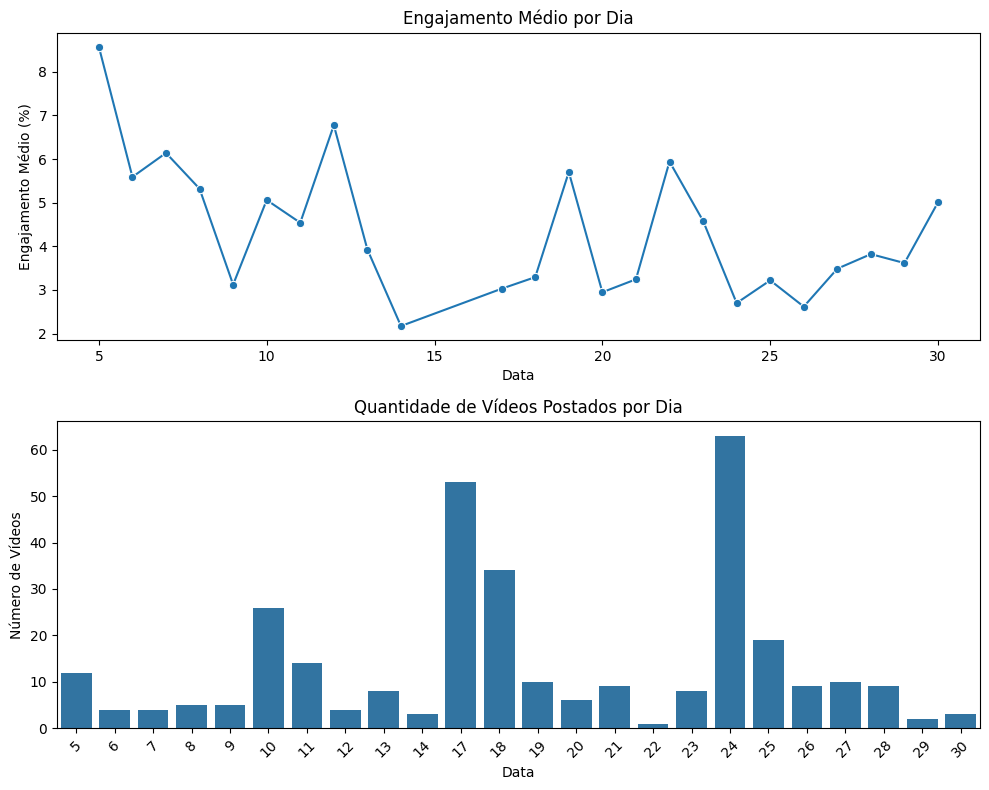

In [89]:
df_grouped = youtube_30_df.groupby('dias_na_plataforma').agg(
    engagement_mean=('engagement_rate', 'mean'), 
    video_count=('Views', 'count')  # Contando vídeos por dia
).reset_index()
fig, ax1 = plt.subplots(2, 1, figsize=(10, 8))

# Gráfico 1: Engajamento médio por dia
sns.lineplot(data=df_grouped, x='dias_na_plataforma', y='engagement_mean', marker='o', ax=ax1[0])
ax1[0].set_title('Engajamento Médio por Dia')
ax1[0].set_ylabel('Engajamento Médio (%)')
ax1[0].set_xlabel('Data')

# Gráfico 2: Quantidade de vídeos por dia
sns.barplot(data=df_grouped, x='dias_na_plataforma', y='video_count', ax=ax1[1])
ax1[1].set_title('Quantidade de Vídeos Postados por Dia')
ax1[1].set_ylabel('Número de Vídeos')
ax1[1].set_xlabel('Data')

# Ajustar layout
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
def get_scale_title(col_data, col_name):
    max_val = col_data.max()
    if max_val >= 1e9:
        scale = " (B)"
    elif max_val >= 1e6:
        scale = " (M)"
    else:
        scale = ""
    return f"{col_name}{scale}"

df_numeric = youtube_30_df.select_dtypes(include = ["float64"])


df_log = df_numeric.apply(lambda x: np.log1p(x) if x.max() > 1e5 else x)


plt.figure(figsize = (16, 12))
for i, col in enumerate(df_log, 1):
    plt.subplot(4, 4, i)
    
    
    if col == "Instrumentalness":
        sns.histplot(youtube_30_df[col], kde = True, binwidth = 0.05)
        plt.ylim(0, 1000)
    else:
        sns.histplot(df_log[col], kde = True)
    
    
    title = get_scale_title(df_numeric[col], col)
    plt.title(f"Distribution of {title} (Log Transformed)" if df_numeric[col].max() > 1e5 else f"Distribution of {col}")
    plt.xlabel(col)
    
plt.tight_layout()
plt.show()

In [ ]:

def find_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers, lower_bound, upper_bound


columns_to_check = ["Duration_min", "Likes", "Views", "Tempo","Comments","engagement_rate"]


plt.figure(figsize = (12, 8))
for i, col in enumerate(columns_to_check, 1):

    outliers, lower, upper = find_outliers_iqr(youtube_30_df, col)

   
    normal_values = youtube_30_df[(youtube_30_df[col] >= lower) & (youtube_30_df[col] <= upper)]

    
    plt.subplot(2, 3, i)
    plt.scatter(normal_values.index, normal_values[col], label = "Normal", alpha = 0.6, c = "green")
    plt.scatter(outliers.index, outliers[col], label = "Outlier", alpha=0.6, c = "red")
    plt.title(f"{col} Scatterplot")
    plt.ylabel(col)
    plt.legend()

    
    print(f"Total number of outliers in column {col}: {len(outliers)}")
    print(f"Lower limit: {lower}, Upper limit: {upper}")
    print("-" * 59)

plt.tight_layout()
plt.show()

In [ ]:
energy_bins = [0, 0.2, 0.4, 0.6, 0.8, 1]
valence_bins = [0, 0.2, 0.4, 0.6, 0.8, 1]
speechiness_bins = [0, 0.33, 0.66, 1]
tempo_bins = [0, 80, 120, 160, 200]

# Grouping the features into bins
youtube_30_df["Energy_group"] = pd.cut(youtube_30_df["Energy"], bins = energy_bins, labels = ["0-0.2", "0.2-0.4", "0.4-0.6", "0.6-0.8", "0.8-1"])
youtube_30_df["Valence_group"] = pd.cut(youtube_30_df["Valence"], bins = valence_bins, labels = ["0-0.2", "0.2-0.4", "0.4-0.6", "0.6-0.8", "0.8-1"])
youtube_30_df["Speechiness_group"] = pd.cut(youtube_30_df["Speechiness"], bins = speechiness_bins, labels = ["0-0.33", "0.33-0.66", "0.66-1"])
youtube_30_df["Tempo_group"] = pd.cut(youtube_30_df["Tempo"], bins = tempo_bins, labels = ["Less Than 80", "80-120", "120-160", "160-200"])
youtube_30_df["Key_group"] = pd.cut(youtube_30_df["Key"], bins = range(0, 12), labels = [f"{i}" for i in range(11)])

# Now that we have done the grouping, let's start visualization
plt.figure(figsize = (16, 12))

# Energy
plt.subplot(2, 3, 1)
youtube_30_df.groupby("Energy_group")["Views"].sum().plot(kind = "bar", color = "midnightblue")
plt.title("Total Views by Energy Group")
plt.xlabel("Energy Group")
plt.ylabel("Total Views")

# Valence
plt.subplot(2, 3, 2)
youtube_30_df.groupby("Valence_group")["Views"].sum().plot(kind = "bar", color = "maroon")
plt.title("Total Views by Valence Group")
plt.xlabel("Valence Group")
plt.ylabel("Total Views")

# Speechiness
plt.subplot(2, 3, 3)
youtube_30_df.groupby("Speechiness_group")["Views"].sum().plot(kind = "bar", color = "darkviolet")
plt.title("Total Views by Speechiness Group")
plt.xlabel("Speechiness Group")
plt.ylabel("Total Views")

# Tempo
plt.subplot(2, 3, 4)
youtube_30_df.groupby("Tempo_group")["Views"].sum().plot(kind = "bar", color = "orange")
plt.title("Total Views by Tempo Group")
plt.xlabel("Tempo Group (BPM)")
plt.ylabel("Total Views")

# Key
plt.subplot(2, 3, 5)
youtube_30_df.groupby("Key_group")["Views"].sum().plot(kind = "bar", color = "limegreen")
plt.title("Total Views by Key Group")
plt.xlabel("Key Group")
plt.ylabel("Total Views")
plt.xticks(rotation = 0)

plt.tight_layout()
plt.show()

In [ ]:

def find_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers, lower_bound, upper_bound


columns_to_check = ["Duration_min", "Likes", "Views", "Tempo","Comments","engagement_rate"]


plt.figure(figsize = (12, 8))
for i, col in enumerate(columns_to_check, 1):

    outliers, lower, upper = find_outliers_iqr(youtube_30_df, col)

   
    normal_values = youtube_30_df[(youtube_30_df[col] >= lower) & (youtube_30_df[col] <= upper)]

    
    plt.subplot(2, 3, i)
    plt.scatter(normal_values.index, normal_values[col], label = "Normal", alpha = 0.6, c = "green")
    plt.scatter(outliers.index, outliers[col], label = "Outlier", alpha=0.6, c = "red")
    plt.title(f"{col} Scatterplot")
    plt.ylabel(col)
    plt.legend()

    
    print(f"Total number of outliers in column {col}: {len(outliers)}")
    print(f"Lower limit: {lower}, Upper limit: {upper}")
    print("-" * 59)

plt.tight_layout()
plt.show()

In [ ]:
corr_matrix = df_numeric.corr()

plt.figure(figsize = (10,8))
sns.heatmap(corr_matrix, annot = True, cmap = "Spectral", center = 0, fmt = ".2f")
plt.title("Correlation Matrix Heat Map")
plt.show()

In [ ]:
album_views = youtube_30_df.groupby("Album_type")["Views"].sum()

# Now let's create the Donut Chart.
plt.figure(figsize = (8, 8))

plt.pie(album_views, labels = album_views.index, autopct = "%1.2f%%", startangle = 135, colors = ["maroon", "lime", "navy"], wedgeprops = dict(width = 0.3))
plt.title("View por Album Type", fontsize = 16)
plt.legend(labels = [f"{label}: {value:,.0f} views" for label, value in zip(album_views.index, album_views)],
           title = "Album Type", loc = "upper left", bbox_to_anchor = (1, 0, 0.5, 1))

In [ ]:
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']
for feature in audio_features:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=youtube_30_df, x=feature, hue='class_egagement_rate', fill=True)
    plt.title(f'Distribution of {feature} by Popularity Type')
    plt.show()

In [ ]:
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']

# Plot scatter plots
for feature_y in audio_features:
      plt.figure(figsize=(10, 6))
      sns.scatterplot(data=youtube_30_df, x='engagement_rate', y=feature_y, hue='class_egagement_rate')
      plt.title(f'engagement_rate vs. {feature_y.capitalize()}')
      plt.tight_layout()
      plt.show()

In [ ]:
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']

# Plot scatter plots
for feature_y in audio_features:
  for feature_x in audio_features:
    if feature_x != feature_y:
      plt.figure(figsize=(10, 6))
      sns.scatterplot(data=youtube_30_df, x=feature_x, y=feature_y, hue='class_egagement_rate')
      plt.title(f'{feature_x.capitalize()} vs. {feature_y.capitalize()}')
      plt.tight_layout()
      plt.show()

## Tres meses

Valores maximo e minimo encontrados no intervalo de tempo:
* Valor maximo de engajamento:  17.467501964589104
* Valor minimo de engajamento:  0.0
    
Numero de amostras:  1107

In [56]:
youtube_90_df.head(3)

,index,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,...,Url_youtube,Title,Channel,Views,Likes,Comments,Description,upload_date,dias_na_plataforma,engagement_rate
6,6,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown) ...,New Gold (feat. Tame Impala and Bootie Brown) ...,single,0.716,0.897,4.0,-7.185,0.0629,...,https://www.youtube.com/watch?v=BONNm0F7Tto,"Gorillaz - New Gold ft. Tame Impala, Bootie Br...",Dom Dolla,451996.0,11686.0,241.0,"Gorillaz 'New Gold' ft. Tame Impala, Bootie Br...",2022-11-18 20:30:00,80,2.638740
31,31,Metallica,Lux Æterna,Lux Æterna,single,0.386,0.996,11.0,-2.960,0.0754,...,https://www.youtube.com/watch?v=_u-7rWKnVVo,Metallica: Lux Æterna (Official Music Video),Metallica,14937918.0,473751.0,46230.0,Metallica's official music video for “Lux Æter...,2022-11-28 15:00:20,70,3.480947
33,33,Metallica,Screaming Suicide,Screaming Suicide,single,0.425,0.972,4.0,-3.448,0.0450,...,https://www.youtube.com/watch?v=ZDyDpdFZHBo,Metallica: Screaming Suicide (Official Music V...,Metallica,4317758.0,217109.0,17225.0,Metallica's official music video for “Screamin...,2023-01-19 23:00:19,18,5.427215


In [57]:
print("Valor maximo de engajamento: ",youtube_90_df.engagement_rate.max())
print("Valor minimo de engajamento: ",youtube_90_df.engagement_rate.min())
print("Numero de amostras: ",len(youtube_90_df))

Valor maximo de engajamento:  17.467501964589104
Valor minimo de engajamento:  0.0
Numero de amostras:  1106


In [58]:
youtube_90_df["class_egagement_rate"] = youtube_90_df["engagement_rate"].apply(lambda x: 1 if x >= 3 else 0)

C:\Users\Samsung\AppData\Local\Temp\ipykernel_33876\1927064356.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  youtube_90_df["class_egagement_rate"] = youtube_90_df["engagement_rate"].apply(lambda x: 1 if x >= 3 else 0)


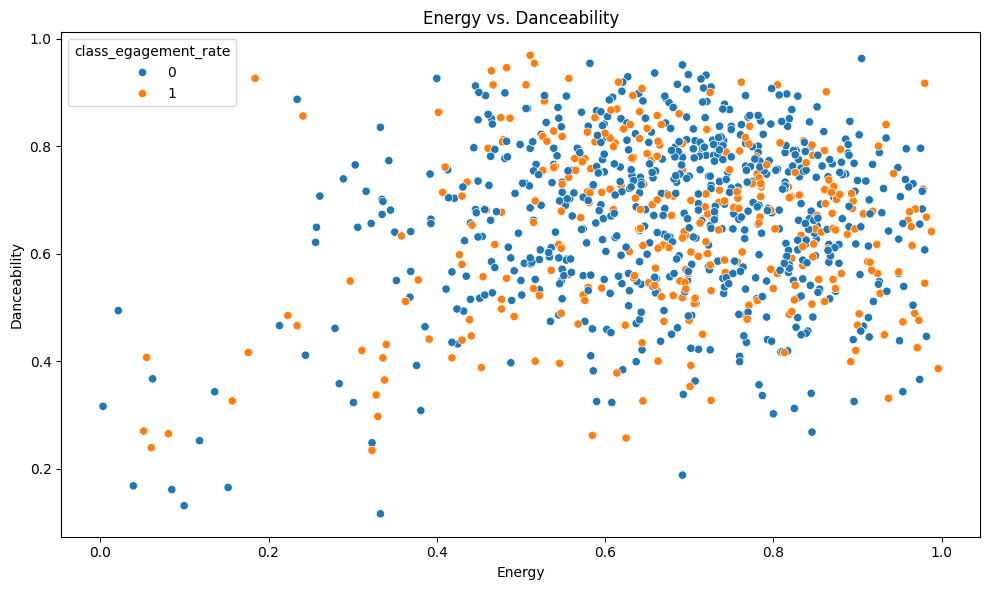

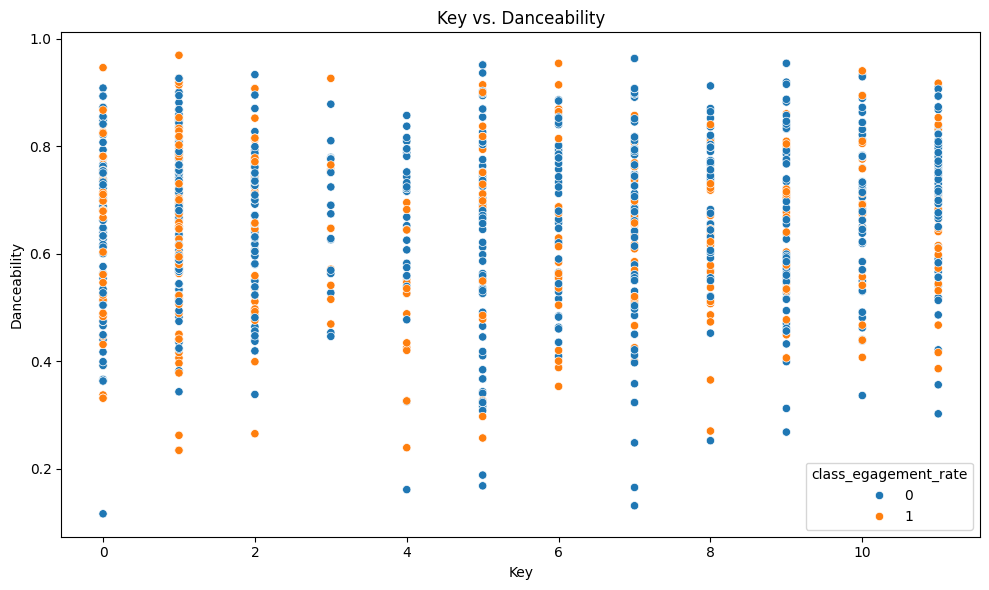

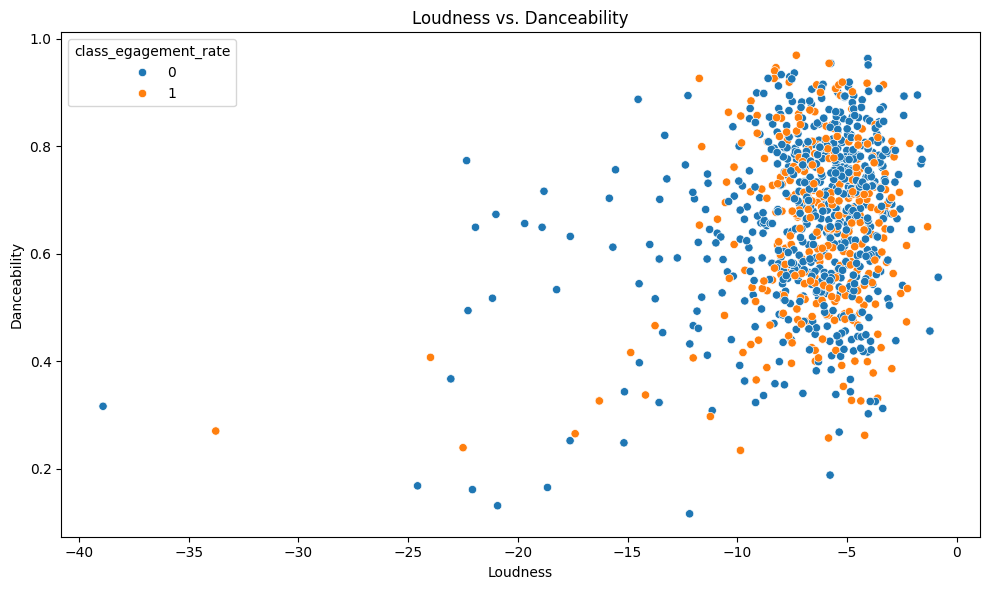

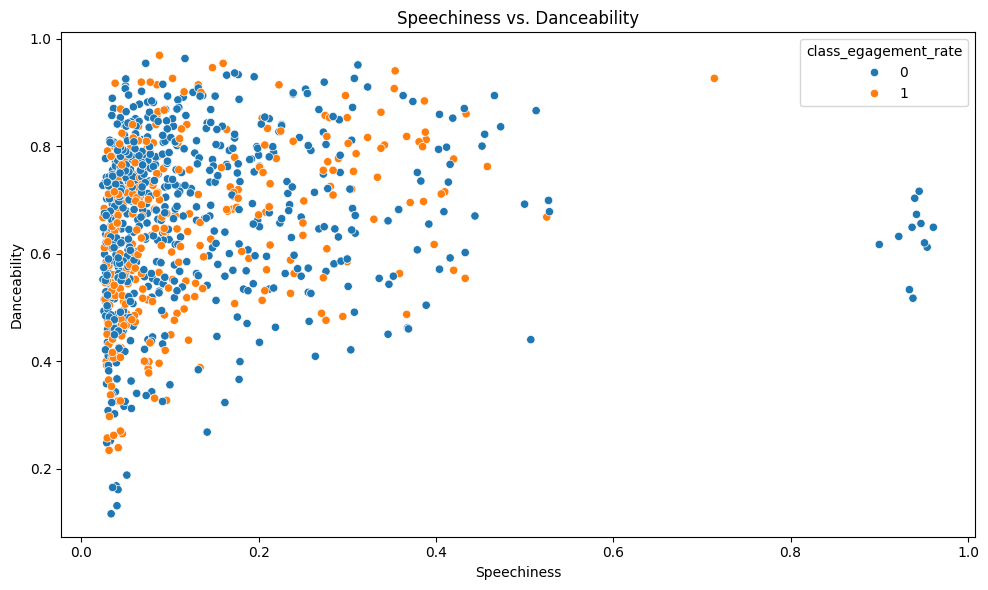

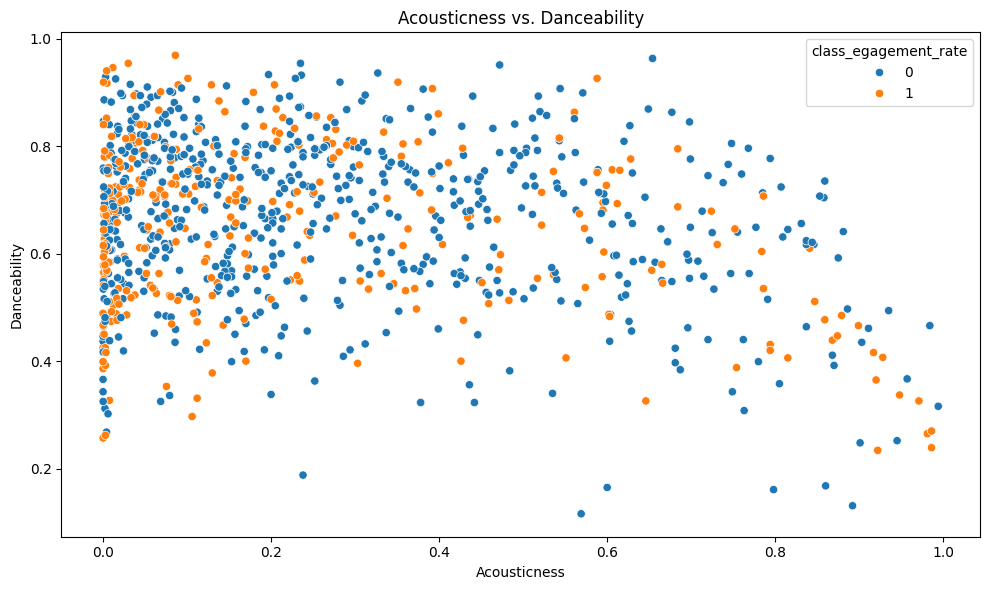

...

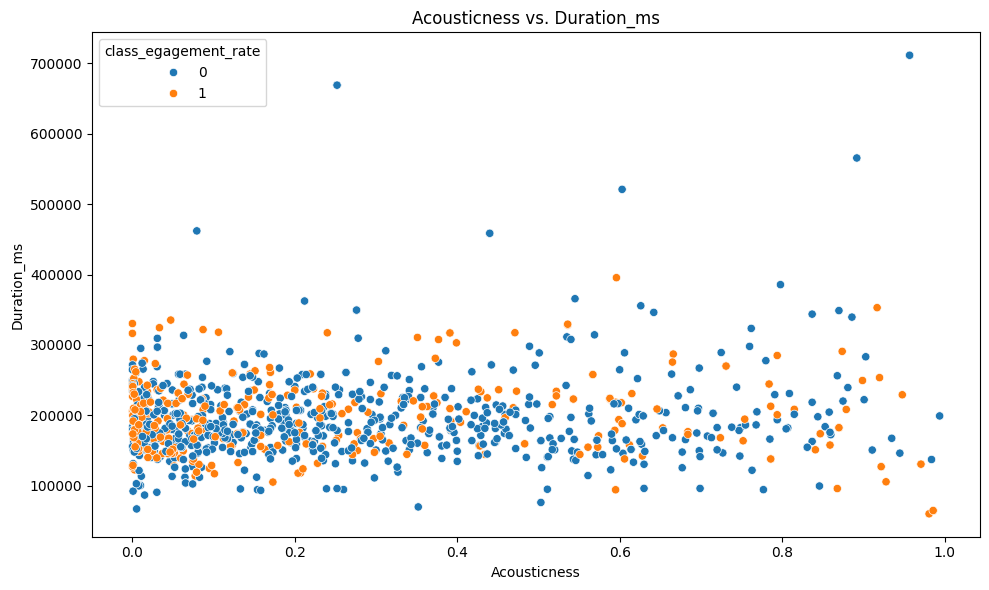

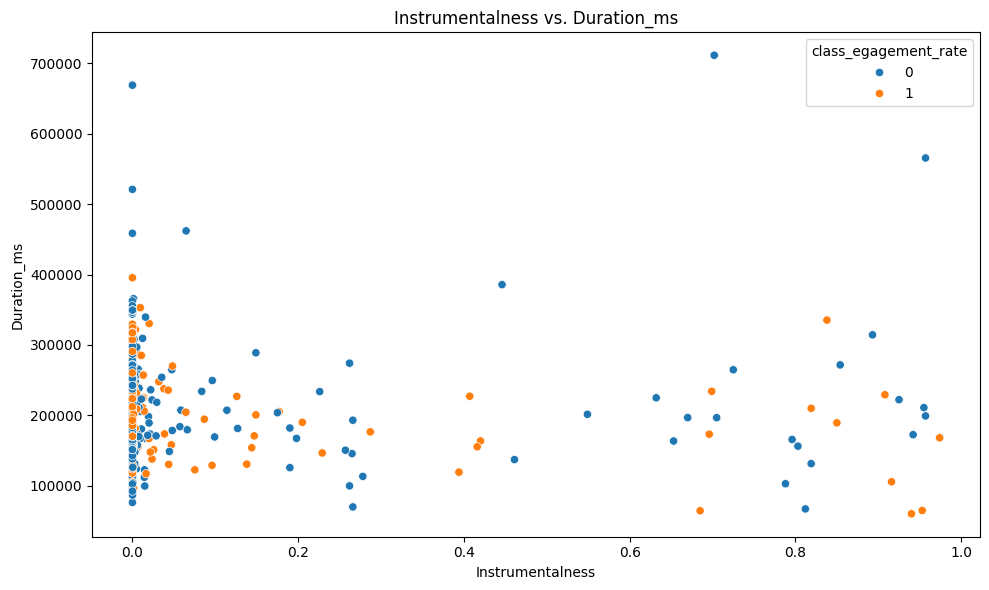

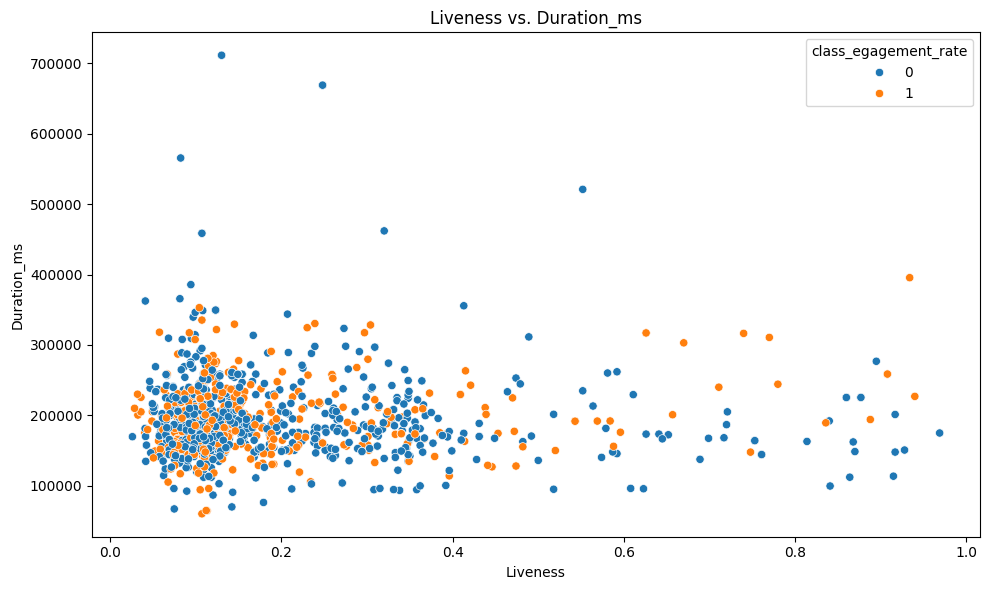

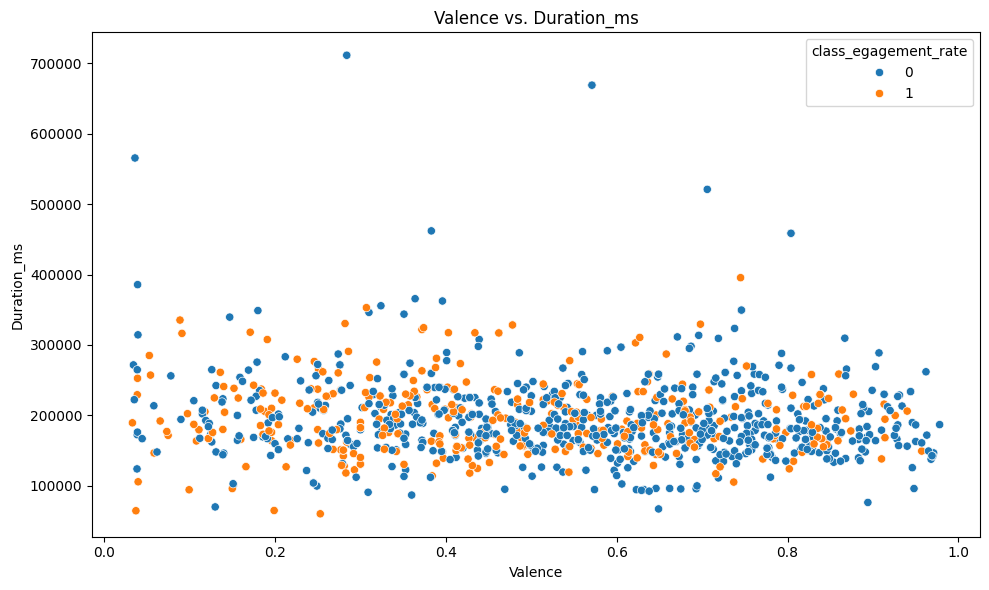

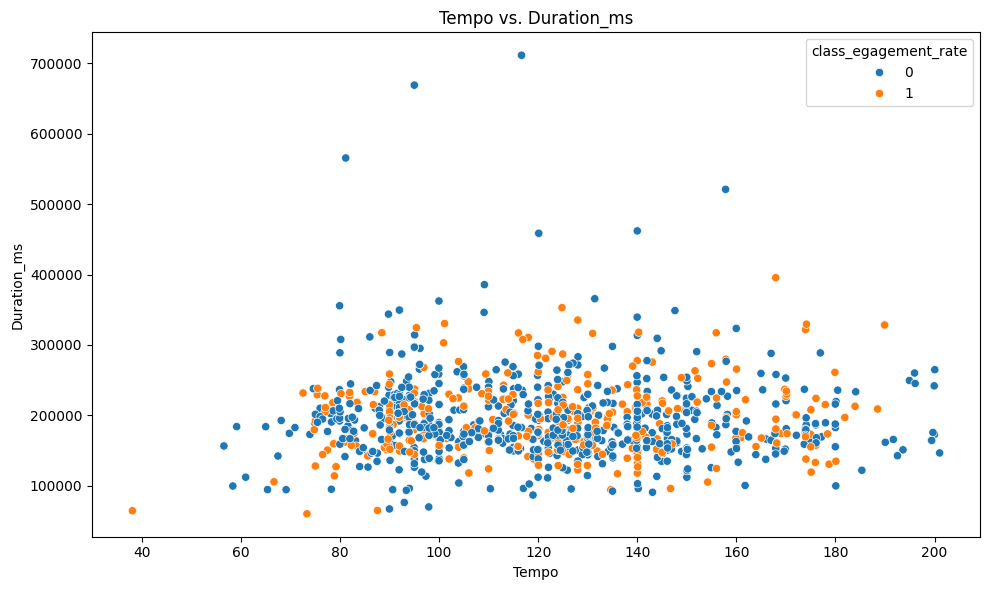

In [59]:
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']

# Plot scatter plots
for feature_y in audio_features:
  for feature_x in audio_features:
    if feature_x != feature_y:
      plt.figure(figsize=(10, 6))
      sns.scatterplot(data=youtube_90_df, x=feature_x, y=feature_y, hue='class_egagement_rate')
      plt.title(f'{feature_x.capitalize()} vs. {feature_y.capitalize()}')
      plt.tight_layout()
      plt.show()

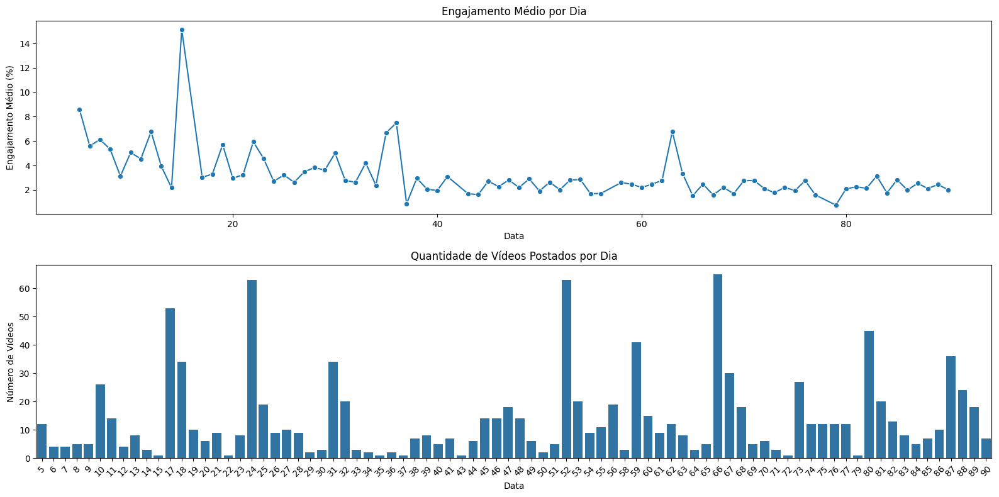

In [ ]:
df_grouped = youtube_90_df.groupby('dias_na_plataforma').agg(
    engagement_mean=('engagement_rate', 'mean'), 
    video_count=('Views', 'count')  # Contando vídeos por dia
).reset_index()
fig, ax1 = plt.subplots(2, 1, figsize=(16, 8))

# Gráfico 1: Engajamento médio por dia
sns.lineplot(data=df_grouped, x='dias_na_plataforma', y='engagement_mean', marker='o', ax=ax1[0])
ax1[0].set_title('Engajamento Médio por Dia')
ax1[0].set_ylabel('Engajamento Médio (%)')
ax1[0].set_xlabel('Data')

# Gráfico 2: Quantidade de vídeos por dia
sns.barplot(data=df_grouped, x='dias_na_plataforma', y='video_count', ax=ax1[1])
ax1[1].set_title('Quantidade de Vídeos Postados por Dia')
ax1[1].set_ylabel('Número de Vídeos')
ax1[1].set_xlabel('Data')

# Ajustar layout
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']

# Plot scatter plots
for feature_y in audio_features:
      plt.figure(figsize=(10, 6))
      sns.scatterplot(data=youtube_90_df, x='engagement_rate', y=feature_y, hue='class_egagement_rate')
      plt.title(f'engagement_rate vs. {feature_y.capitalize()}')
      plt.tight_layout()
      plt.show()

## Dose meses

Valores maximo e minimo encontrados no intervalo de tempo:
* Valor maximo de engajamento:  25.346066004877994
* Valor minimo de engajamento:  0.0
    
Numero de amostras:  3379

In [60]:
youtube_365_df.head(3)

,index,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,...,Url_youtube,Title,Channel,Views,Likes,Comments,Description,upload_date,dias_na_plataforma,engagement_rate
2,2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,0.695,0.923,1.0,-3.930,0.0522,...,https://www.youtube.com/watch?v=qJa-VFwPpYA,Gorillaz - New Gold ft. Tame Impala & Bootie B...,Gorillaz,8435055.0,282142.0,7399.0,Gorillaz - New Gold ft. Tame Impala & Bootie B...,2022-08-31 17:21:40,159,3.432592
6,6,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown) ...,New Gold (feat. Tame Impala and Bootie Brown) ...,single,0.716,0.897,4.0,-7.185,0.0629,...,https://www.youtube.com/watch?v=BONNm0F7Tto,"Gorillaz - New Gold ft. Tame Impala, Bootie Br...",Dom Dolla,451996.0,11686.0,241.0,"Gorillaz 'New Gold' ft. Tame Impala, Bootie Br...",2022-11-18 20:30:00,80,2.638740
7,7,Gorillaz,Cracker Island (feat. Thundercat),Cracker Island (feat. Thundercat),single,0.741,0.913,2.0,-3.340,0.0465,...,https://www.youtube.com/watch?v=S03T47hapAc,Gorillaz - Cracker Island ft. Thundercat (Offi...,Gorillaz,24459820.0,739527.0,20296.0,Listen to Cracker Island: https://gorillaz.lnk...,2022-07-28 16:00:11,193,3.106413


In [61]:
print("Valor maximo de engajamento: ",youtube_365_df.engagement_rate.max())
print("Valor minimo de engajamento: ",youtube_365_df.engagement_rate.min())
print("Numero de amostras: ",len(youtube_365_df))

Valor maximo de engajamento:  25.346066004877994
Valor minimo de engajamento:  0.0
Numero de amostras:  3378


In [66]:
youtube_365_df[youtube_365_df['engagement_rate']>=25]

,index,Artist,Track,Album,Album_type,Danceability,Energy,Key,Loudness,Speechiness,...,Title,Channel,Views,Likes,Comments,Description,upload_date,dias_na_plataforma,engagement_rate,class_egagement_rate
15021,7201,j-hope,Intro,Jack In The Box,album,0.607,0.355,5.0,-14.867,0.828,...,j-hope 'Intro' Visualizer,BANGTANTV,954081.0,237761.0,4061.0,Connect with BTS: \nhttps://ibighit.com/bts \n...,2022-07-21 04:00:20,200,25.346066,1


In [62]:
youtube_365_df["class_egagement_rate"] = youtube_365_df["engagement_rate"].apply(lambda x: 1 if x >= 3 else 0)

C:\Users\Samsung\AppData\Local\Temp\ipykernel_33876\1258724004.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  youtube_365_df["class_egagement_rate"] = youtube_365_df["engagement_rate"].apply(lambda x: 1 if x >= 3 else 0)


In [ ]:
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']

# Plot scatter plots
for feature_x in audio_features:
  for feature_y in audio_features:
    if feature_x != feature_y:
      plt.figure(figsize=(10, 6))
      sns.scatterplot(data=youtube_365_df, x=feature_x, y=feature_y, hue='class_egagement_rate')
      plt.title(f'{feature_y.capitalize()} vs. {feature_x.capitalize()}')
      plt.tight_layout()
      plt.show()

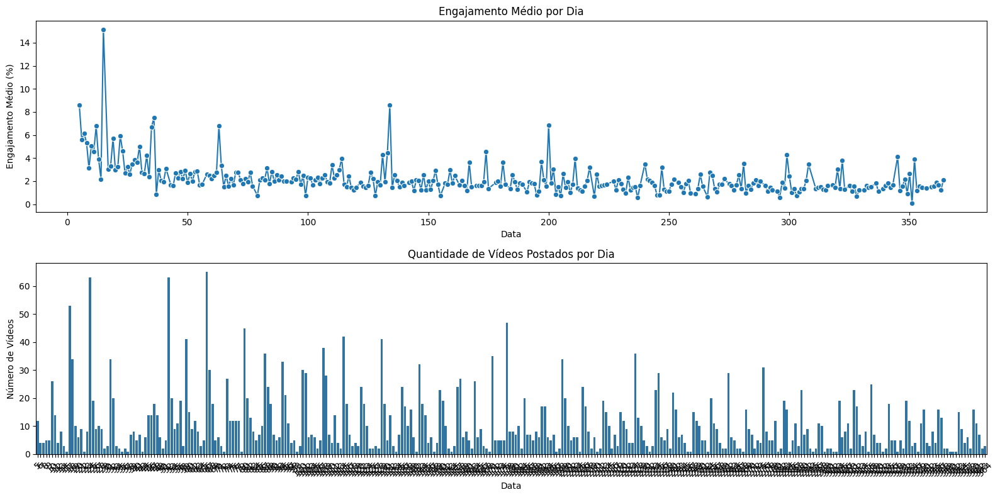

In [ ]:
df_grouped = youtube_365_df.groupby('dias_na_plataforma').agg(
    engagement_mean=('engagement_rate', 'mean'), 
    video_count=('Views', 'count')  # Contando vídeos por dia
).reset_index()
fig, ax1 = plt.subplots(2, 1, figsize=(16, 8))

# Gráfico 1: Engajamento médio por dia
sns.lineplot(data=df_grouped, x='dias_na_plataforma', y='engagement_mean', marker='o', ax=ax1[0])
ax1[0].set_title('Engajamento Médio por Dia')
ax1[0].set_ylabel('Engajamento Médio (%)')
ax1[0].set_xlabel('Data')

# Gráfico 2: Quantidade de vídeos por dia
sns.barplot(data=df_grouped, x='dias_na_plataforma', y='video_count', ax=ax1[1])
ax1[1].set_title('Quantidade de Vídeos Postados por Dia')
ax1[1].set_ylabel('Número de Vídeos')
ax1[1].set_xlabel('Data')

# Ajustar layout
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']

# Plot scatter plots
for feature_y in audio_features:
      plt.figure(figsize=(10, 6))
      sns.scatterplot(data=youtube_365_df, x=feature_y, y='engagement_rate', hue='class_egagement_rate')
      plt.title(f'engagement_rate vs. {feature_y.capitalize()}')
      plt.tight_layout()
      plt.show()

In [ ]:
plt.figure(figsize = (12, 6))
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']

# Plot scatter plots
for feature_x in audio_features:
    # Likes vs Duration_min
    plt.subplot(1, 2, 1)
    plt.scatter(data=youtube_365_df, x=feature_x, y='Views', color = "green", alpha = 0.5)
    plt.title(f"Views vs {feature_x.capitalize()}")
    plt.xlabel(f"{feature_x.capitalize()}")
    plt.ylabel("Views")

    # Views vs Duration_min
    plt.subplot(1, 2, 2)
    plt.scatter(data=youtube_365_df, x=feature_x, y='Likes', color = "midnightblue", alpha = 0.5)
    plt.title(f"Likes vs {feature_x.capitalize()}")
    plt.xlabel(f"{feature_x.capitalize()}")
    plt.ylabel("Likes")

    plt.tight_layout()
    plt.show()

# Analise Spotify

In [74]:
spotify_data_df=spotify_df[spotify_df['dias_na_plataforma']<45]

In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyOAuth

# Configurar autenticação
sp = spotipy.Spotify(auth_manager=SpotifyOAuth(
    client_id="",
    client_secret="",
    redirect_uri="http://localhost:8888/callback",
    scope="user-read-private user-read-email user-library-read"
))

cache = {}

def get_track_release_date(spotify_uri, delay=0.5):
    """ Obtém a data de lançamento da música, reduzindo a frequência das requisições """
    track_id = spotify_uri.split(":")[-1]  # Extrai o ID da música
    
    # Verifica se já temos a data no cache
    if track_id in cache:
        return cache[track_id]
    
    try:
        track_info = sp.track(track_id)  # Busca detalhes da música
        release_date = track_info["album"]["release_date"]  # Obtém a data de lançamento do álbum
        
        cache[track_id] = release_date  # Salva no cache para evitar chamadas repetidas
        time.sleep(delay)  # Aguarda para evitar limite de requisições
        return release_date
    
    except spotipy.exceptions.SpotifyException as e:
        print(f"Erro ao buscar a música {track_id}: {e}")
        return None



# Exemplo de links de músicas
track_urls = spotify_data_df.Uri.to_list()
spotify_uploads=[]


# Buscar datas de lançamento
for url in track_urls:
    spotify_uploads.append(get_track_release_date(url))

spotify_data_df['spotify_upload']=spotify_uploads

In [ ]:
spotify_df=spotify_df[spotify_df["spotify_upload"]!="0000"]
spotify_df = spotify_df.dropna(subset=['spotify_upload'])
spotify_df["spotify_upload"] = pd.to_datetime(spotify_df["spotify_upload"])

In [ ]:
data_extracao = pd.to_datetime("2023-02-07")
spotify_df["dias_na_plataforma"] = (data_extracao - spotify_df["spotify_upload"]).dt.days

In [78]:
spotify_30_df=spotify_df[spotify_df['dias_na_plataforma']<31]
spotify_90_df=spotify_df[spotify_df['dias_na_plataforma']<91]
spotify_365_df=spotify_df[spotify_df['dias_na_plataforma']<366]

## Um Mes

In [55]:
spotify_30_df.head(3)

,index,Artist,Url_spotify,Track,Album,Album_type,Uri,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Stream,dias_na_plataforma
33,33,Metallica,https://open.spotify.com/artist/2ye2Wgw4gimLv2...,Screaming Suicide,Screaming Suicide,single,spotify:track:6ZCh9hBeFzMIPycRnyPqZT,0.425,0.972,4.0,-3.448,0.0450,0.000024,0.020200,0.2390,0.282,101.125,330453.0,3905429.0,18
105,105,P!nk,https://open.spotify.com/artist/1KCSPY1glIKqW2...,TRUSTFALL,TRUSTFALL,single,spotify:track:4FWbsd91QSvgr1dSWwW51e,0.636,0.888,8.0,-3.889,0.0945,0.001620,0.000216,0.1470,0.250,122.032,237200.0,2790105.0,10
136,136,Shakira,https://open.spotify.com/artist/0EmeFodog0BfCg...,"Shakira: Bzrp Music Sessions, Vol. 53","Shakira: Bzrp Music Sessions, Vol. 53",single,spotify:track:4nrPB8O7Y7wsOCJdgXkthe,0.778,0.632,2.0,-5.600,0.0493,0.274000,0.000000,0.0915,0.498,122.104,218289.0,196761853.0,25


In [56]:
print("Valor maximo de streams: ",spotify_30_df.Stream.max())
print("Valor minimo de stremas: ",spotify_30_df.Stream.min())
print("Valor medio de stremas: ",spotify_30_df.Stream.mean())
print("Numero de amostras: ",len(spotify_30_df))

Valor maximo de streams:  403097672.0
Valor minimo de stremas:  6574.0
Valor medio de stremas:  13915023.838607594
Numero de amostras:  322


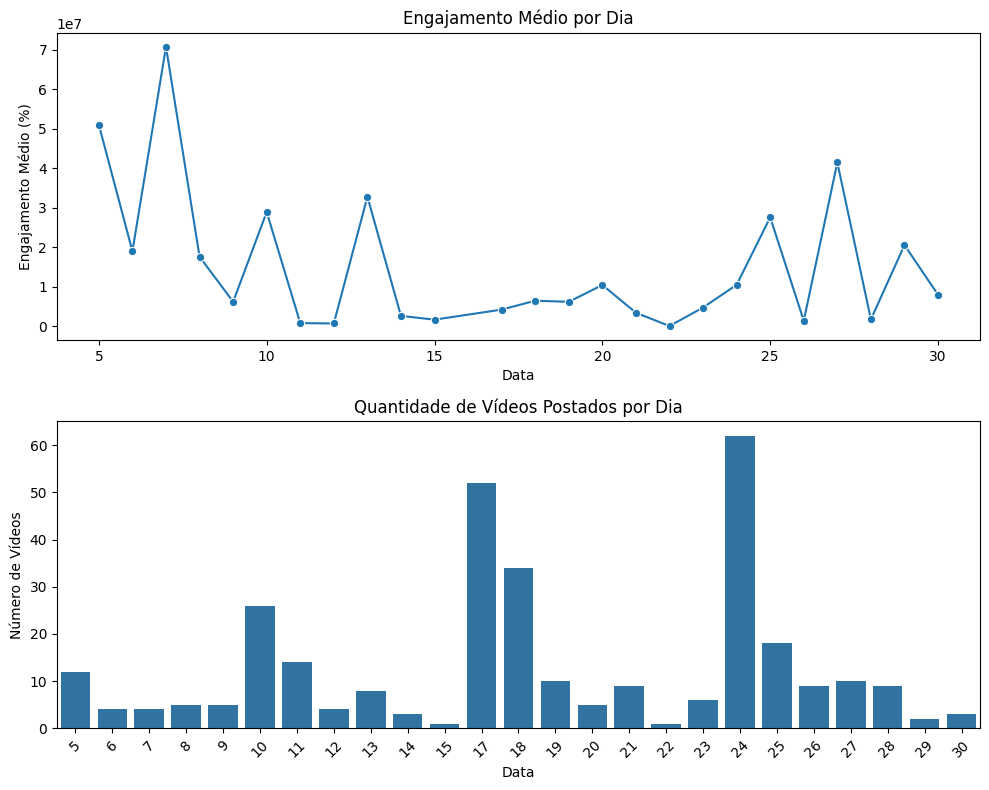

In [57]:
df_grouped = spotify_30_df.groupby('dias_na_plataforma').agg(
    engagement_mean=('Stream', 'mean'), 
    video_count=('Stream', 'count')  # Contando vídeos por dia
).reset_index()
fig, ax1 = plt.subplots(2, 1, figsize=(10, 8))

# Gráfico 1: Engajamento médio por dia
sns.lineplot(data=df_grouped, x='dias_na_plataforma', y='engagement_mean', marker='o', ax=ax1[0])
ax1[0].set_title('Engajamento Médio por Dia')
ax1[0].set_ylabel('Engajamento Médio (%)')
ax1[0].set_xlabel('Data')

# Gráfico 2: Quantidade de vídeos por dia
sns.barplot(data=df_grouped, x='dias_na_plataforma', y='video_count', ax=ax1[1])
ax1[1].set_title('Quantidade de Vídeos Postados por Dia')
ax1[1].set_ylabel('Número de Vídeos')
ax1[1].set_xlabel('Data')

# Ajustar layout
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()